# Try low pass filter

In [1]:
import numpy as np
from pydub import AudioSegment
from glob import glob
from matplotlib import pyplot as plt
import os
import IPython.display
%matplotlib inline

In [2]:
ls

audio_signal.png               note_cutoff_threshold.ipynb
io_test_audio.py               note_low_pass_filter.ipynb
io_test_movie.py               note_soundfile_vs_pydub.ipynb
note_code_snippet.ipynb        unused/


In [3]:
import nitro_editor

In [4]:
# noisy_sound = '../sample_files/sample_5.m4a'
noisy_sound = '../sample_files/sample_0.wav'
editor = nitro_editor.audio.AudioEditor(noisy_sound)

2019-10-13 16:38:35,044 root         DEBUG    audio info
2019-10-13 16:38:35,046 root         DEBUG     * sample size     : 1
2019-10-13 16:38:35,047 root         DEBUG     * sample sec      : 16.000
2019-10-13 16:38:35,049 root         DEBUG     * channel         : 1
2019-10-13 16:38:35,051 root         DEBUG     * frame rate      : 8000
2019-10-13 16:38:35,053 root         DEBUG     * sample width    : 2
2019-10-13 16:38:35,056 root         DEBUG     * audio_amplitude : 23000 (max), -15848 (min)
2019-10-13 16:38:35,057 root         DEBUG     * no video


2019-10-13 16:38:35,631 root         DEBUG    cutoff threshold (percentile method)
2019-10-13 16:38:35,632 root         DEBUG     * percentile: 3090.00 with 0.900 percentile


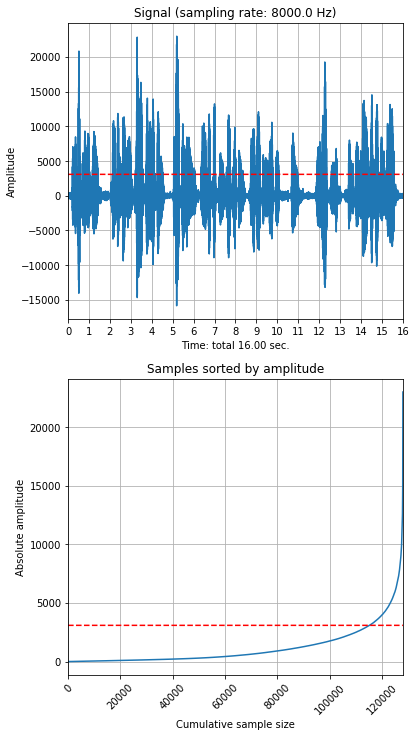

In [5]:
editor.vis_amplitude_clipping(ratio=0.9, path_to_save='./audio_signal.png')
plt.show()
# amplitude_clipping(0.1, ratio=0.9, return_threshould=True)
# flg, th = editor.amplitude_clipping(0.1, ratio=0.9, return_threshould=True)
# print(flg, th)

In [5]:
def plot_wave(wave_data, freq, th=None):
    assert len(wave_data.shape) == 1
    
    amp_sorted = np.sort(np.abs(wave_data))
    
    plt.figure(figsize=(6, 4))
    plt.plot(wave_data)
    plt.plot([th]*len(wave_data), color='red', linestyle='--')
    plt.grid()
    
    interval = 10
    length_sec = int(len(wave_data)/freq) + 1
    interval = min(10, length_sec)
    ind_1 = np.arange(0, length_sec+1, int(length_sec/interval))
    ind_2 = ind_1 * freq
    plt.title('Wave signal (%0.1f Hz)' % freq)
    plt.xticks(ind_2, ind_1)
    plt.xlim([0, len(wave_data)])
    plt.xlabel("Time (sec.): total %0.2f" % (len(wave_data)/freq))
    plt.ylabel("Amplitude")
    
    plt.figure(figsize=(6, 4))
    plt.xticks(rotation=45)
    plt.plot(amp_sorted)
    plt.plot([th]*len(wave_data), color='red', linestyle='--')
    plt.grid()
    plt.title('Wave amplitude')
    plt.xlim([0, len(wave_data)])
    plt.xlabel("Sample size lower than the amplitude")
    plt.ylabel("Amplitude")

    plt.show()


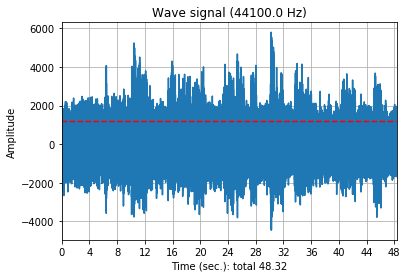

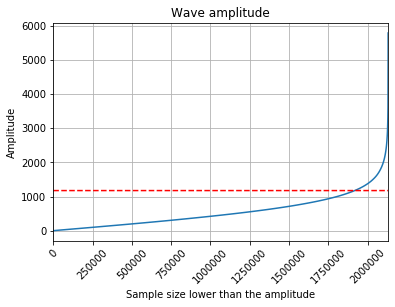

In [6]:
plot_wave(editor.wave_array[0], editor.frame_rate, th)

In [37]:
IPython.display.Audio(noisy_sound)

## Bandpass filter

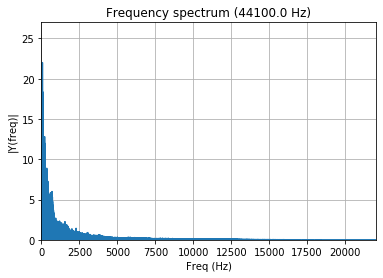

In [78]:
def get_frequency_domain(wave_data,
                         freq):
    n = len(wave_data) # length of the signal
    k = np.arange(n)
    t = n/freq
    freq = k/t # two sides frequency range
    freq = freq[range(int(n/2))] # one side frequency range

    data_freq = np.fft.fft(wave_data)/n # fft computing and normalization
    data_freq = data_freq[range(int(n/2))]
    return data_freq, freq

def vis_frequency(wave_data, freq):
    data_freq, frq = get_frequency_domain(wave_data, freq)

    plt.figure(figsize=(6, 4))
    plt.title('Frequency spectrum (%0.1f Hz)' % freq)

    plt.plot(frq, abs(data_freq)) # plotting the spectrum
    plt.grid()
    plt.xlabel("Freq (Hz)")
    plt.ylabel("|Y(freq)|")
    plt.xlim([0, frq.max()])
    plt.ylim([0, abs(data_freq).max() + 5])
    plt.show()
    return data_freq, frq

fr, fr_x = vis_frequency(editor.wave_array[0], editor.frame_rate)

In [87]:
# np.sum(fr_x != np.sort(fr_x))
np.abs(fr)

array([1.63147150e-01, 2.41891146e-01, 1.64990364e-02, ...,
       4.16924830e-04, 1.99251224e-04, 1.31842247e-04])

In [42]:
from scipy.signal import butter, lfilter


def butter_bandpass(fs: float,
                    lowcut: float = None,
                    highcut: float = None,
                    order: int = 5):
    """ Filter coefficient
    - Bandpass (lowcut < frequency < highcut)
    - Lowpass (frequency < lowcut)
    - Hihgpass (highcut < frequency)


     Parameter
    ------------
    fs: float
        sampling frequency
    lowcut: float
        cut off frequency (low)
    highcut: float
        cut off frequency (high)

     Return
    ------------
    filter coefficient a
    filter coefficient b
    """
    nyq = 0.5 * fs
    if lowcut is None and highcut is None:
        return None
    elif lowcut is None and highcut is not None:
        cutoff = highcut / nyq
        [b, a] = butter(order, [cutoff], btype='high')
    elif lowcut is not None and highcut is None:
        cutoff = lowcut / nyq
        [b, a] = butter(order, [cutoff], btype='low')
    else:
        low = lowcut / nyq
        high = highcut / nyq
        [b, a] = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data,
                           fs: int,
                           cutoff: list = None,
                           order: int = 6,
                           return_filter: bool=False):

    """ Bandpass filter

    - Bandpass (lowcut < frequency < highcut)
    - Lowpass (frequency < lowcut)
    - Hihgpass (highcut < frequency)

     Parameter
    ------------------
    data:
        target data
    fs: float
        sampling frequency
    lowcut: float
        cut off frequency (low)
    highcut: float
        cut off frequency (high)
    order: int
        filter order

     Return
    ------------------
    filtered signal
    """
    if cutoff is None:
        return data
    if len(cutoff) != 2:
        raise ValueError('cutoff shoud be [low, high]')

    lowcut, highcut = cutoff
    [b, a] = butter_bandpass(fs, lowcut, highcut, order)
    y = lfilter(b, a, data)
    if return_filter:
        return y, [b, a]
    else:
        return y


In [66]:
def write(_file, data, freq, sample_width, ch):
    """ write audio to file (format should be same as the input audio file) """
    wave_array_np_serial = data #np.reshape(data.T, [-1])
    print(_file, freq, sample_width, ch, len(data), data.shape)

    audio_segment = AudioSegment(
        wave_array_np_serial.tobytes(),
        frame_rate=freq,
        sample_width=sample_width,
        channels=ch)
    audio_format = _file.split('.')[-1]
    audio_segment.export(_file, audio_format)

def vis_filter(wave_data, freq, sample_width, ch,  500.0, highcut = 1250.0, order: int=6):
    from scipy.signal import freqz
    
    # get filtered wave
    wave_data_filtered = butter_bandpass_filter(wave_data, fs=freq, lowcut=lowcut, highcut=highcut, order=order)
    wave_data_filtered = wave_data_filtered.astype(np.int16)
    
    write('../sample_files/sample_5_edit.wav', wave_data_filtered, freq=freq, sample_width=sample_width, ch=ch)
    write('../sample_files/sample_5.wav', wave_data, freq=freq, sample_width=sample_width, ch=ch)
    
    # Plot the frequency response for a few different orders.
    plt.figure()
    plt.grid()
    plt.title('Frequency response')
    for o in [order-3, order, order+3]:
        b, a = butter_bandpass(fs=freq, lowcut=lowcut, highcut=highcut, order=o)
        w, h = freqz(b, a, worN=2000)
        plt.plot((freq * 0.5 / np.pi) * w, abs(h), label="order = %d" % o)

    plt.plot([0, 0.5 * freq], [np.sqrt(0.5), np.sqrt(0.5)],
             '--', label='sqrt(0.5)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Gain')
    plt.legend(loc='best')
    plt.xlim([0, int(0.5 * freq)])

    # Filter a noisy signal
    plt.figure(figsize=(6, 4))
    plt.title('Wave signal (%0.1f Hz)' % freq)
    plt.grid()
    plt.plot(wave_data, label='raw signal')
    plt.plot(wave_data_filtered, label='filtered signal')
    # setup ticks
    interval = 10
    length_sec = int(len(wave_data)/freq) + 1
    interval = min(10, length_sec)
    ind_1 = np.arange(0, length_sec+1, int(length_sec/interval))
    ind_2 = ind_1 * freq
    plt.xticks(ind_2, ind_1)
    plt.xlim([0, len(wave_data)])
    plt.xlabel("Time (sec.): total %0.2f" % (len(wave_data)/freq))
    plt.ylabel("Amplitude")
    plt.legend(loc='best')
    return wave_data_filtered


../sample_files/sample_5_edit.wav 44100 2 1 2130880 (2130880,)
../sample_files/sample_5.wav 44100 2 1 2130880 (2130880,)


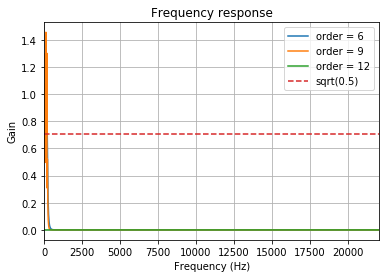

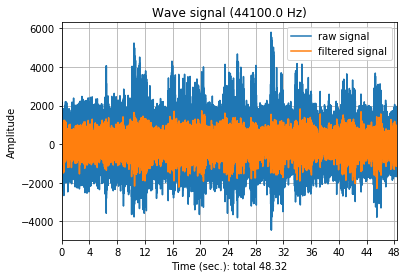

In [72]:
filtered_wav = vis_filter(editor.wave_array[0],
           sample_width=editor.sample_width,
           ch=editor.channels,
           freq=editor.frame_rate,
           highcut=None,
           lowcut=200,
           order=9)
IPython.display.Audio('../sample_files/sample_5_edit.wav')

In [50]:
IPython.display.Audio('../sample_files/sample_5.wav')

In [65]:
wav_ed = filtered_wav.astype(np.int16)
wav_org = editor.wave_array[0]
print(wav_ed)
print(wav_org)

[ 44 101  57 ...   0   0   0]
[79 89 39 ...  0  0  0]


array([79, 89, 39, ...,  0,  0,  0], dtype=int16)